In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import pygam

In [2]:
# Read input file

working_directory = "RNA Sequencing Data/"

# Use adata from velocity analysis
adata = scanpy.read_h5ad(working_directory + "/velocity_scvelo.h5ad")

# # Or read saved anndata objects from Cellrank analysis
# base_name = "cellrank_1.3"
# adata = scanpy.read_h5ad(
#     working_directory+f"/{base_name} cells.h5ad"
# )
# dead_end_adata = scanpy.read_h5ad(
#     working_directory+f"/{base_name} dead end genes.h5ad"
# )
# mESC_adata = scanpy.read_h5ad(
#     working_directory+f"/{base_name} mESC genes.h5ad"
# )
# driver_df = pandas.read_csv(
#     working_directory+f"{base_name} driver genes.csv",
# )

print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'manual_root', 'manual_end', 'velocity_pseudotime', 'latent_time'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'day_colors', 'log1p', 'neighbors', 'pca', 'recover_dynamics', 'sample_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_fdl', 'X_pca', 'X_umap', 'velocity_fdl'

In [3]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=7.291]

In [5]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [6]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 15 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [25]:
# Combine all three kernels

combined_kernel = 0.4*velocity_kernel + 0.4*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.4 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=7.291] + 0.4 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

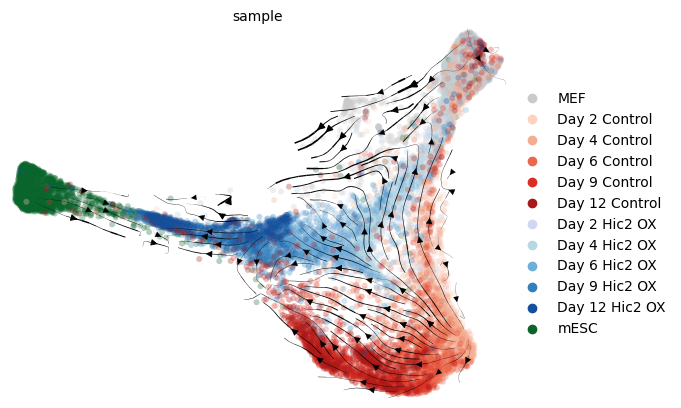

In [26]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

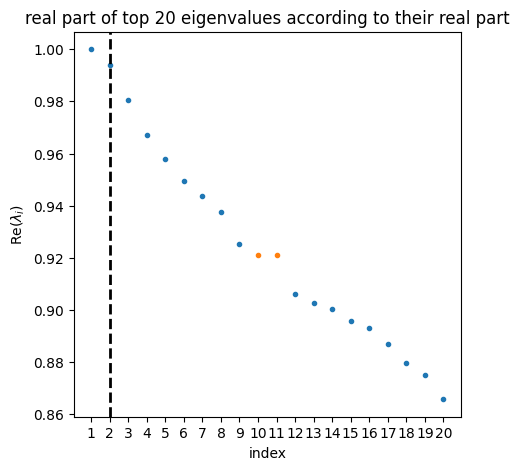

In [27]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

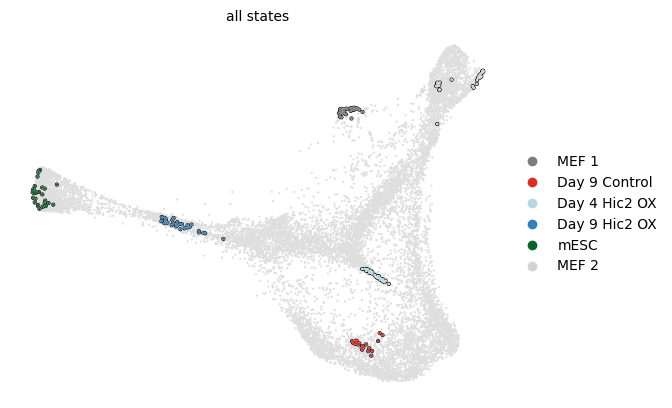

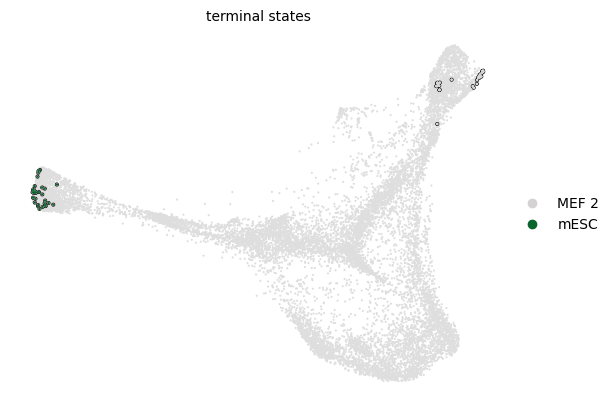

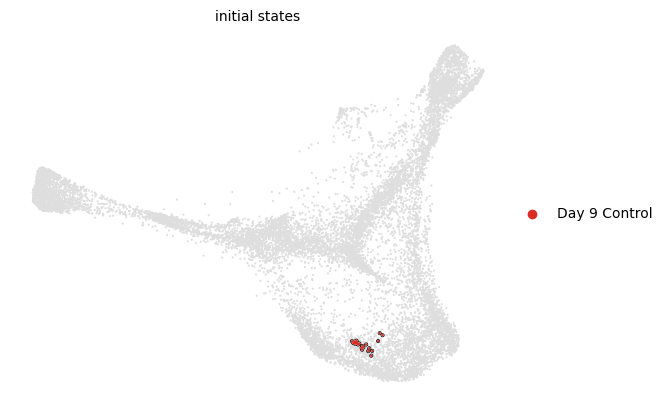

In [28]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.fit(n_states=[4, 9], cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

The velocity information is so noisy that the correct initial state is not found.

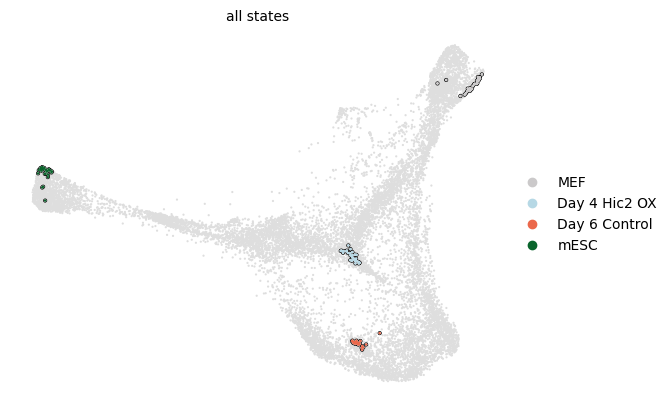

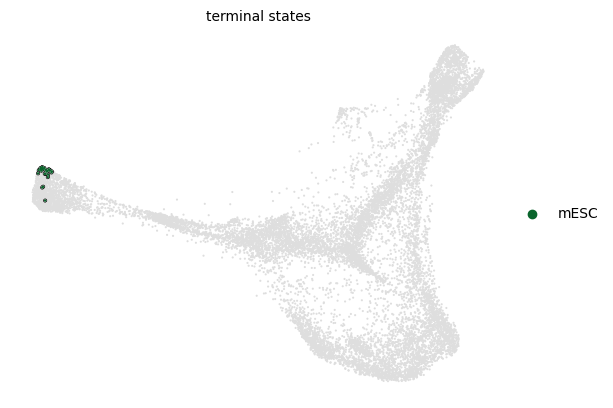

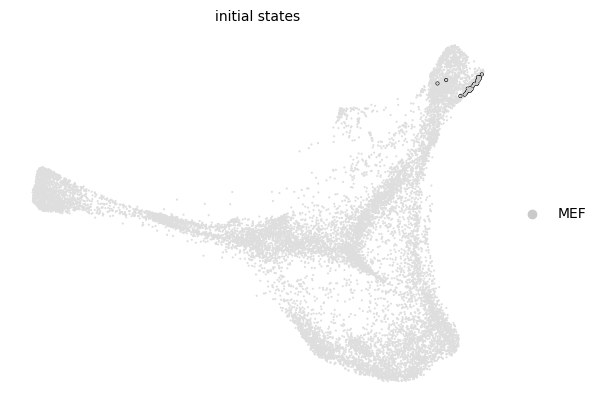

In [31]:
estimator = cellrank.estimators.GPCCA(0.1*velocity_kernel + 0.7*latent_time_kernel + 0.2*connectivity_kernel)
estimator.fit(n_states=[4, 10], cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

Less than 0.2 velocity kernel information is necessary to not find the wrong initial state.

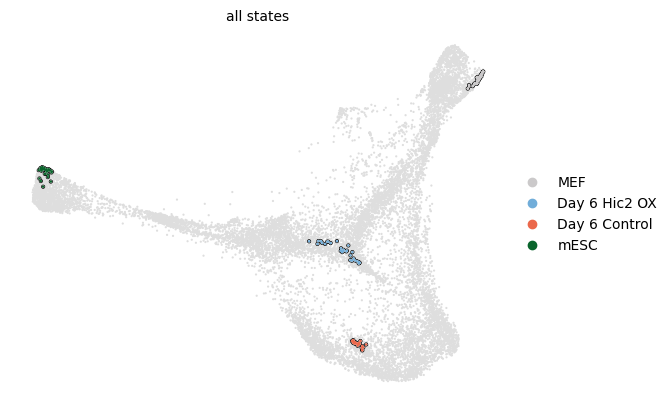

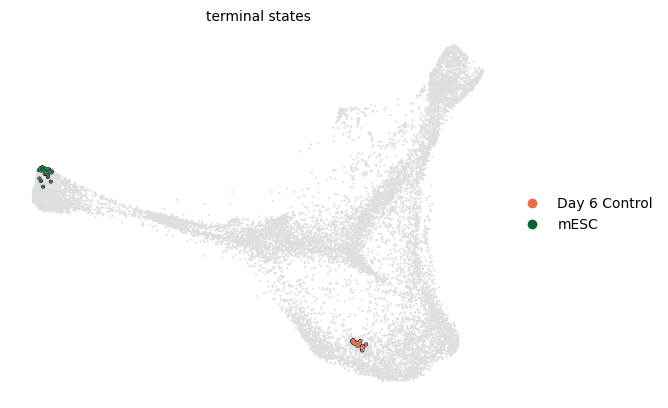

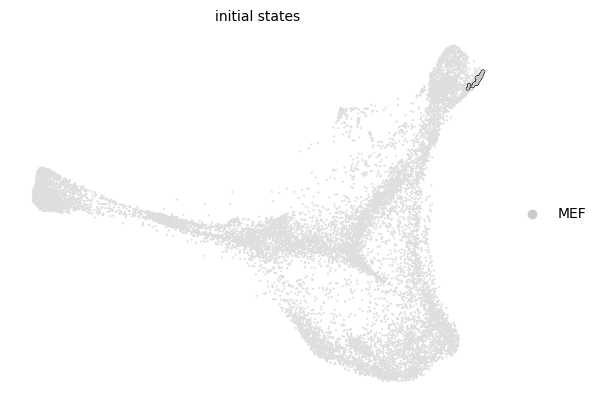

In [32]:
estimator = cellrank.estimators.GPCCA(0.8*latent_time_kernel + 0.2*connectivity_kernel)
estimator.fit(n_states=[4, 10], cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

Without the velocity kernel, the states are reasonable.

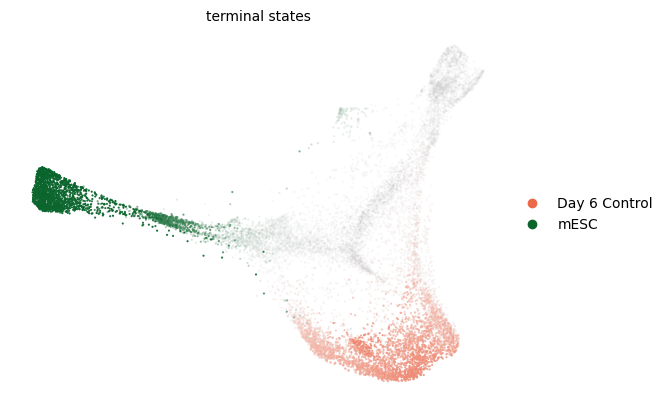

In [33]:
# Plot probability of cells belonging to the terminal states

estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=False, basis="fdl")

In [34]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

      Macrostate  Stability
3           mESC   0.998378
2  Day 6 Control   0.989642
1  Day 6 Hic2 OX   0.989142
0            MEF   0.978530


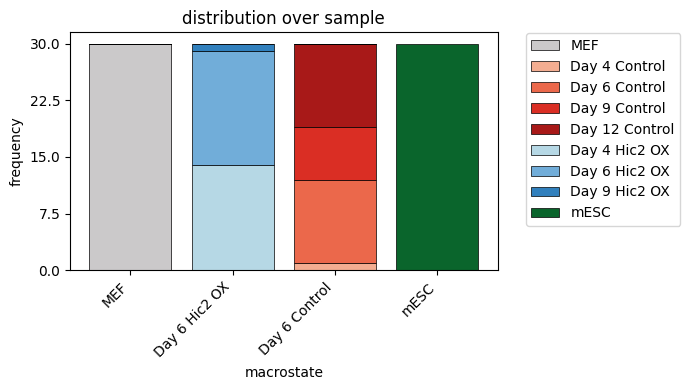

In [35]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

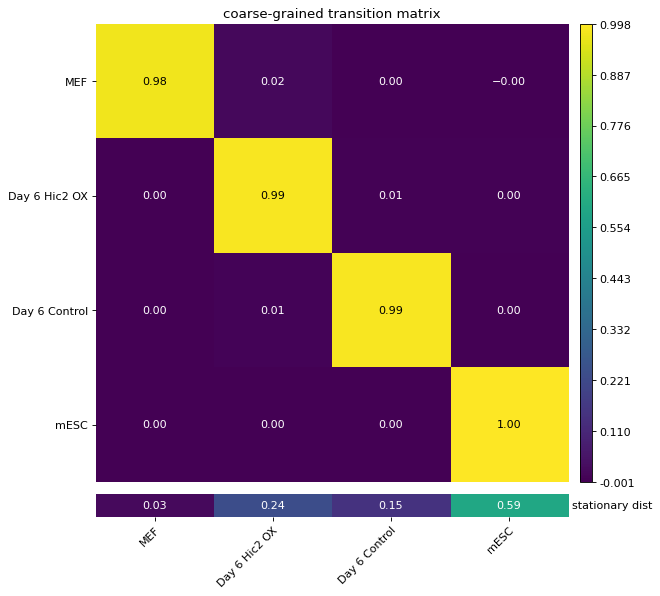

In [36]:
estimator.plot_coarse_T()

  0%|          | 0/2 [00:00<?, ?/s]

  0%|          | 0/2 [00:00<?, ?/s]

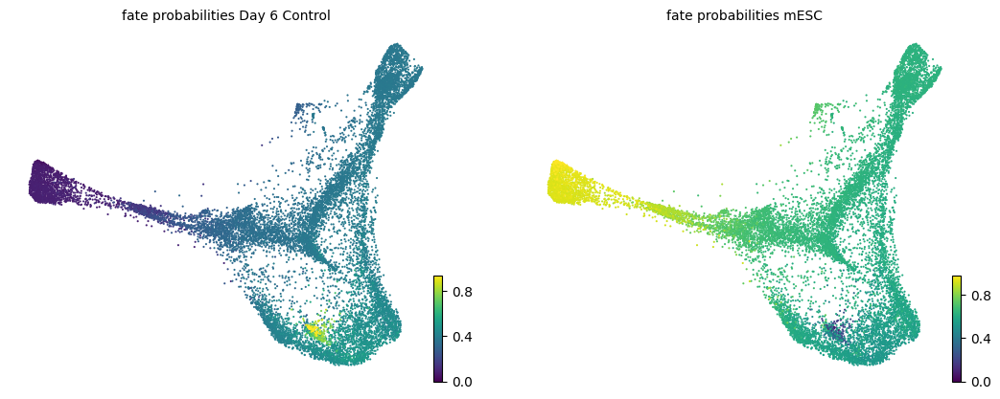

In [37]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

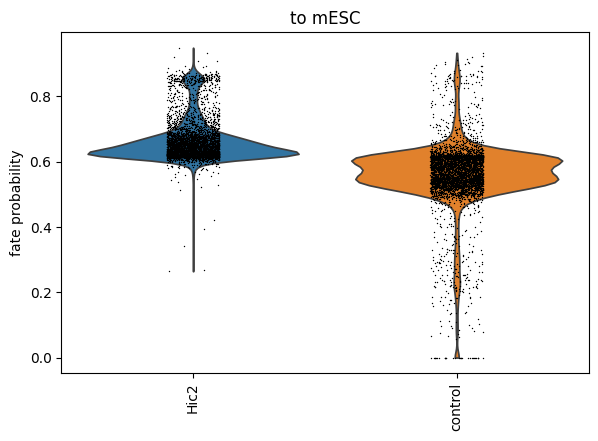

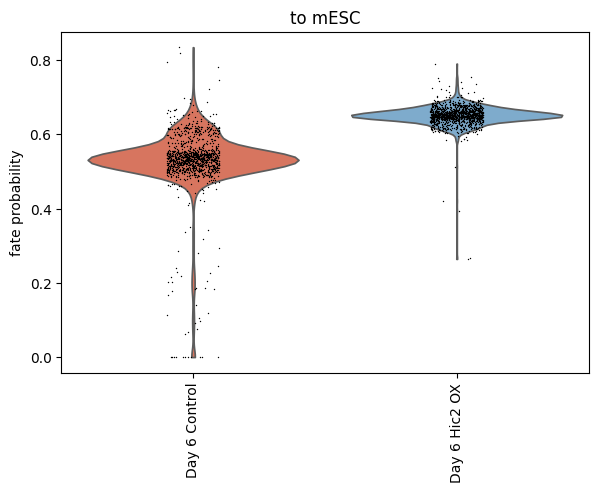

In [38]:
# Aggregate fate probabilities

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["mESC"],
    cluster_key="group",
    clusters=["control", "Hic2"],
)

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["mESC"],
    cluster_key="sample",
    clusters=["Day 6 Control", "Day 6 Hic2 OX"],
)

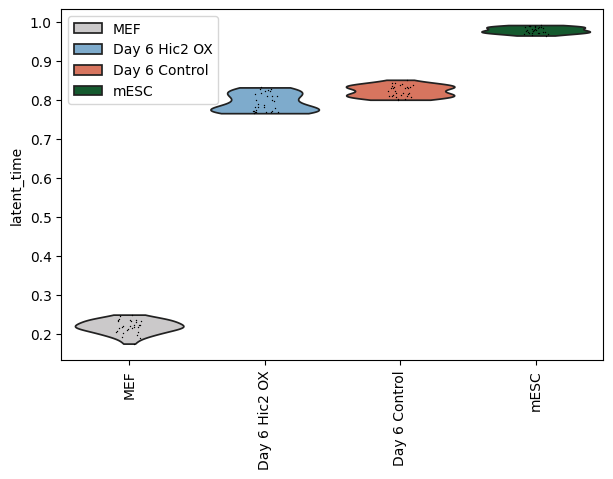

In [39]:
# Show macrostates in latent time

scanpy.pl.violin(adata, keys=["latent_time"], groupby="macrostates_fwd", rotation=90)

## Find driver genes for the terminal states

In [40]:
# Find driver genes for all terminal states

reprogramming_groups = ["Hic2", "control"]


driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)
corr_columns = [state+"_corr" for state in terminal_states]

In [41]:
# Drivers for mESCs
driver_df.sort_values("mESC_corr", ascending=False).head(20)[corr_columns]

,Day 6 Control_corr,mESC_corr
gene_names,,
Rbpms2,-0.538857,0.538858
Apoc1,-0.525139,0.525141
Trap1a,-0.521604,0.521604
Dnmt3l,-0.511021,0.511025
Utf1,-0.504293,0.504295
Fbxo15,-0.499843,0.499846
Dppa4,-0.495668,0.495669
Dppa5a,-0.487298,0.487302
Agtrap,-0.484117,0.484122


In [42]:
# Drivers for Day 12 control
dead_end = "Day 6 Control"
driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20)[corr_columns]

,Day 6 Control_corr,mESC_corr
gene_names,,
Cd24a,0.584549,-0.584578
Lgals7,0.530596,-0.530590
Ctsz,0.502398,-0.502450
Lmo1,0.496566,-0.496565
Crip2,0.495568,-0.495583
Rtn4r,0.489089,-0.489089
S100a16,0.467396,-0.467404
Dkkl1,0.464409,-0.464402
Crb3,0.462322,-0.462312


In [43]:
# How specific genes correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Ovol1", "Atf3"]
terminal_states = list(adata.obs["term_states_fwd"].dropna().unique())
corr_columns = [state+"_corr" for state in terminal_states]
driver_df.loc[genes_of_interest]

,Day 6 Control_corr,Day 6 Control_pval,Day 6 Control_qval,Day 6 Control_ci_low,Day 6 Control_ci_high,mESC_corr,mESC_pval,mESC_qval,mESC_ci_low,mESC_ci_high
gene_names,,,,,,,,,,
Krtdap,0.139582,6.436795e-43,1.882032e-42,0.119868,0.159186,-0.139572,6.528789e-43,1.908930e-42,-0.159176,-0.119858
Krt8,0.442375,0.000000e+00,0.000000e+00,0.426105,0.458358,-0.442366,0.000000e+00,0.000000e+00,-0.458350,-0.426095
Krt14,0.292252,2.732858e-190,2.107149e-189,0.273807,0.310482,-0.292246,2.785738e-190,2.147922e-189,-0.310476,-0.273801
Nanog,-0.308096,1.077217e-212,9.560904e-212,-0.326131,-0.289837,0.308093,1.087127e-212,9.648857e-212,0.289835,0.326128
Tet1,-0.456063,0.000000e+00,0.000000e+00,-0.471798,-0.440038,0.456068,0.000000e+00,0.000000e+00,0.440042,0.471803
Cdh1,0.286119,5.150533e-182,3.866772e-181,0.267605,0.304422,-0.286118,5.165750e-182,3.878196e-181,-0.304421,-0.267604
Ovol1,0.460565,0.000000e+00,0.000000e+00,0.444622,0.476217,-0.460566,0.000000e+00,0.000000e+00,-0.476218,-0.444623
Atf3,0.456749,0.000000e+00,0.000000e+00,0.440736,0.472472,-0.456751,0.000000e+00,0.000000e+00,-0.472474,-0.440738


## Gene expression trends

### Expression trends for genes of interest

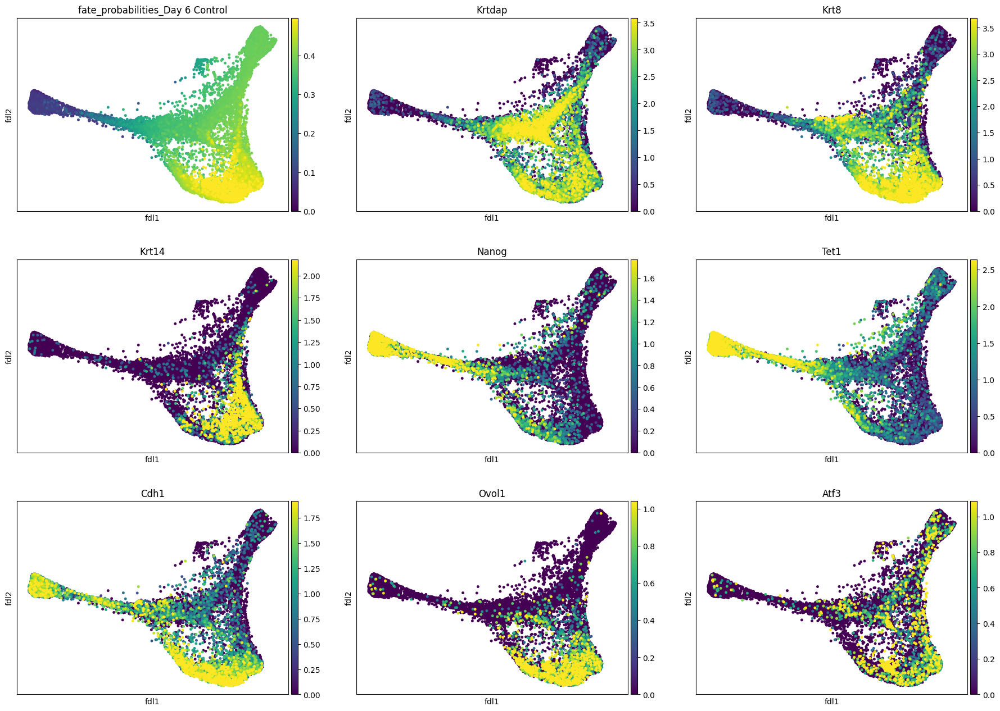

In [44]:
# Visualize genes of interest

terminal_state = dead_end
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + genes_of_interest,
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

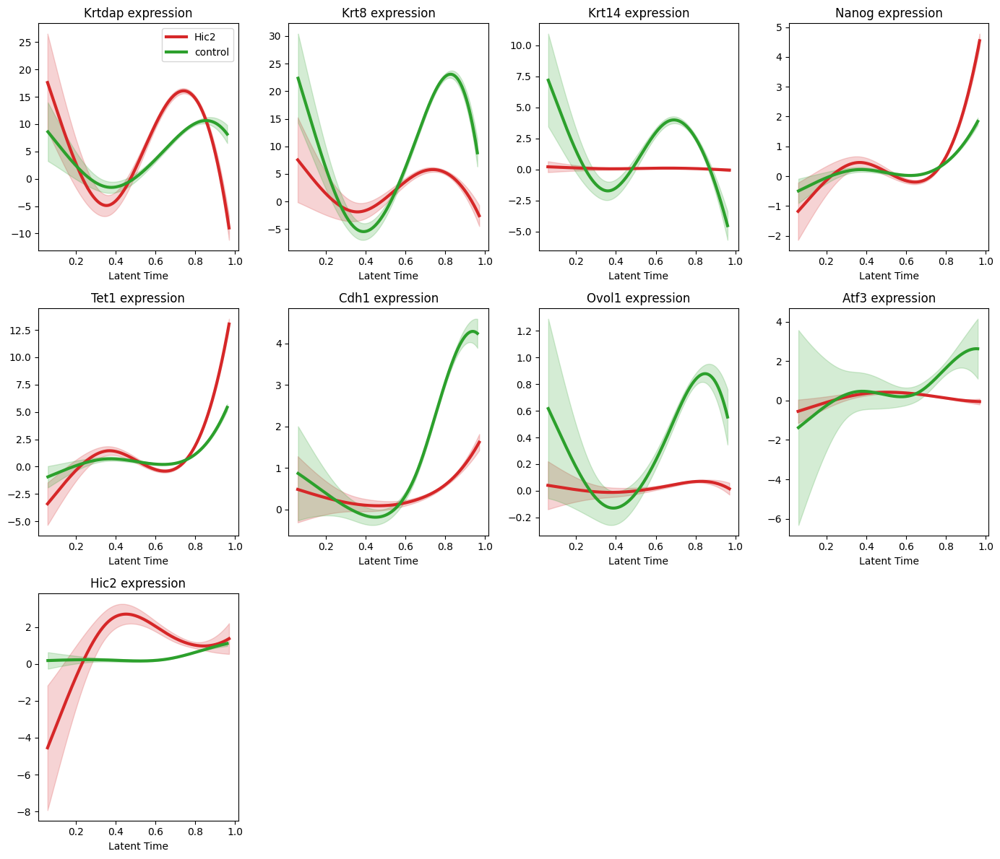

In [45]:
# Trends independent of trajectory

def plot_grouped_gene_trend(adata, genes, group_key="group", time_key="latent_time", layer="Ms", groups=None, columns=4, figure_width=14, plot_height=4):
    """
    Plots smoothed gene expression using Generalized Additive Models (GAMs).
    This provides true smooth local regression with confidence intervals.
    """

    number_of_genes = len(genes)
    number_of_columns = min(columns, number_of_genes)
    
    # Calculate rows
    rows = (number_of_genes + number_of_columns - 1) // number_of_columns
    
    figure, axes = pyplot.subplots(rows, number_of_columns)
    figure.set_figwidth(figure_width)
    figure.set_figheight(plot_height * rows)

    # Handle single gene case (axes is not an array) and 1D array case
    if number_of_genes == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    # Define colors for groups
    unique_groups = adata.obs[group_key].unique()
    palette = seaborn.color_palette("tab10", n_colors=len(unique_groups))
    color_map = dict(zip(unique_groups, palette))

    for gene_index, gene in enumerate(genes):
        axis = axes_flat[gene_index]
        
        # Fetch expression data
        expr_data = adata[:, gene].layers[layer]
        if hasattr(expr_data, "toarray"):
            expr_data = expr_data.toarray()
        expr_data = expr_data.flatten()
        
        # Create DataFrame
        df = pandas.DataFrame({
            "Latent Time": adata.obs[time_key],
            "Expression": expr_data,
            "Group": adata.obs[group_key]
        })
        
        # Determine which groups to plot
        if groups is None:
            # If no specific list, plot all groups found in the data
            plot_groups = df["Group"].unique()
        else:
            plot_groups = groups

        # Loop through each group and fit a GAM
        for group in plot_groups:
            group_data = df[df["Group"] == group]
            
            # Skip empty groups
            if len(group_data) < 10:
                continue

            # Prepare X and y for pygam (X must be 2D array)
            X = group_data["Latent Time"].values.reshape(-1, 1)
            y = group_data["Expression"].values
            
            # Fit LinearGAM using a Spline term s(0)
            # n_splines=20 gives good flexibility (smoothness)
            gam = pygam.LinearGAM(pygam.s(0, n_splines=6)).fit(X, y)
            
            # Generate a smooth grid for plotting lines
            X_grid = numpy.linspace(X.min(), X.max(), 500)
            
            # Predict values and confidence intervals
            y_pred = gam.predict(X_grid)
            confidence_intervals = gam.confidence_intervals(X_grid, width=0.95)
            
            # Plot Line
            color = color_map[group]
            axis.plot(X_grid, y_pred, label=group, color=color, linewidth=3)
            
            # Plot Confidence Interval (Fill)
            axis.fill_between(
                X_grid, 
                confidence_intervals[:, 0], 
                confidence_intervals[:, 1], 
                color=color, 
                alpha=0.2 # Transparency of CI
            )

        axis.set_title(f"{gene} expression")
        axis.set_xlabel("Latent Time")
        
        # Add legend only to the first plot to avoid clutter
        if gene_index == 0:
            axis.legend()

    # Clean up empty subplots
    for i in range(number_of_genes, len(axes_flat)):
        axes_flat[i].axis('off')

    pyplot.tight_layout()
    pyplot.show()

# Example usage
plot_grouped_gene_trend(
    adata, 
    genes_of_interest + ["Hic2"], 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

To use GAM, pygam is needed

To use GAMR, r-base, rpy2 and mgcv are needed

  0%|          | 0/10 [00:00<?, ?gene/s]

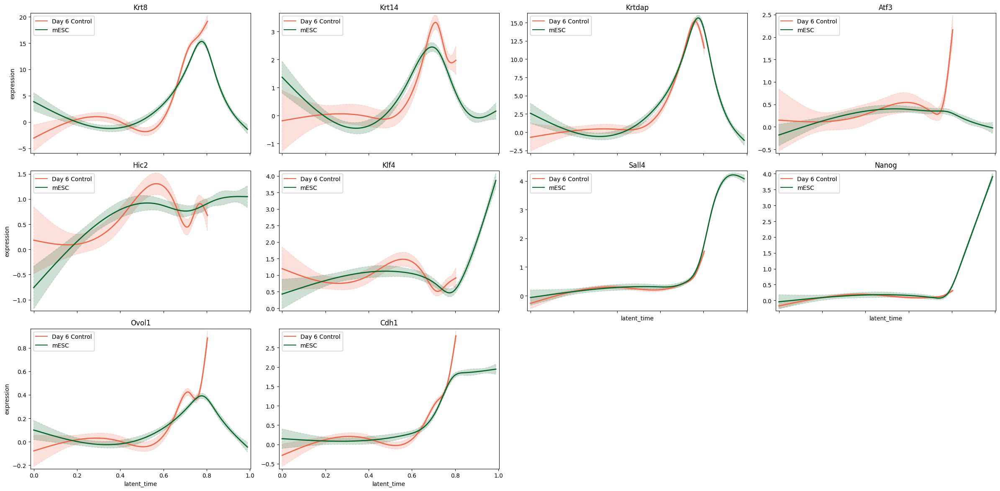

In [46]:
# All groups

trend_genes = ["Krt8", "Krt14", "Krtdap", "Atf3", "Hic2", "Klf4", "Sall4", "Nanog", "Ovol1", "Cdh1"]

model = cellrank.models.GAMR(adata, n_knots=6, smoothing_penalty=10.0) # GAMR can be used instead to have the R model

cellrank.pl.gene_trends(
    adata,
    model=model,
    genes=trend_genes,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/10 [00:00<?, ?gene/s]

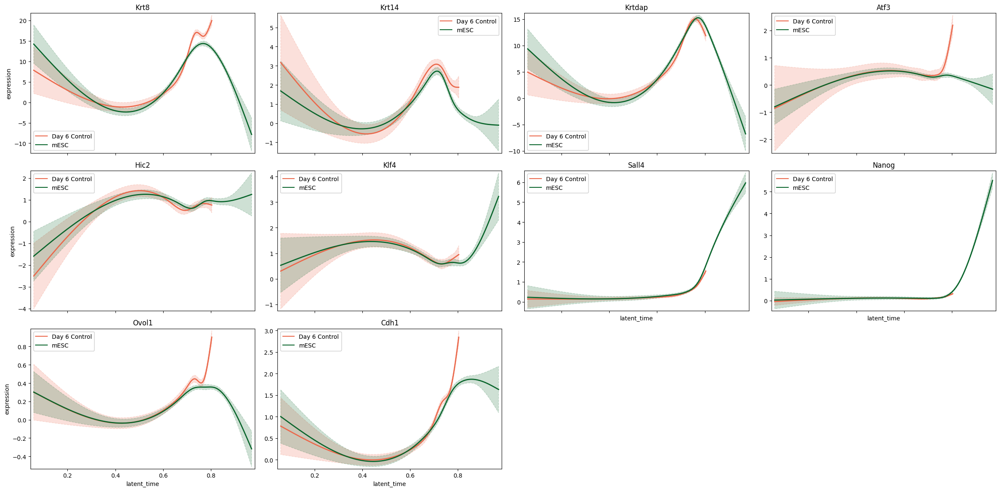

In [47]:
# Control and Hic2 group

trend_genes = ["Krt8", "Krt14", "Krtdap", "Atf3", "Hic2", "Klf4", "Sall4", "Nanog", "Ovol1", "Cdh1", "Hic2"]
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0) # Pygam can also be used with GAM instead of GAMR

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=trend_genes,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/10 [00:00<?, ?gene/s]

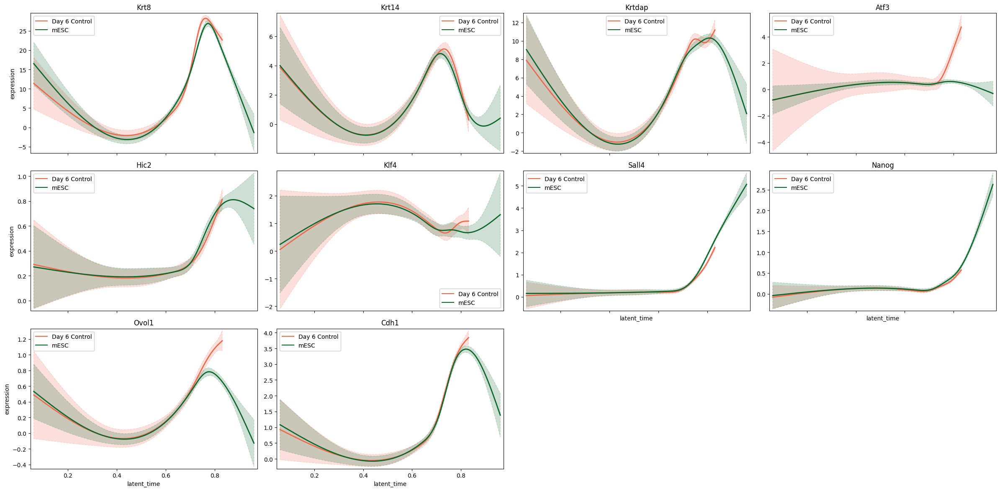

In [48]:
# Only control

trend_genes = ["Krt8", "Krt14", "Krtdap", "Atf3", "Hic2", "Klf4", "Sall4", "Nanog", "Ovol1", "Cdh1"]
control_indices = adata.obs["group"] == "control"

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=trend_genes,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


### Expression trends for dead end drivers

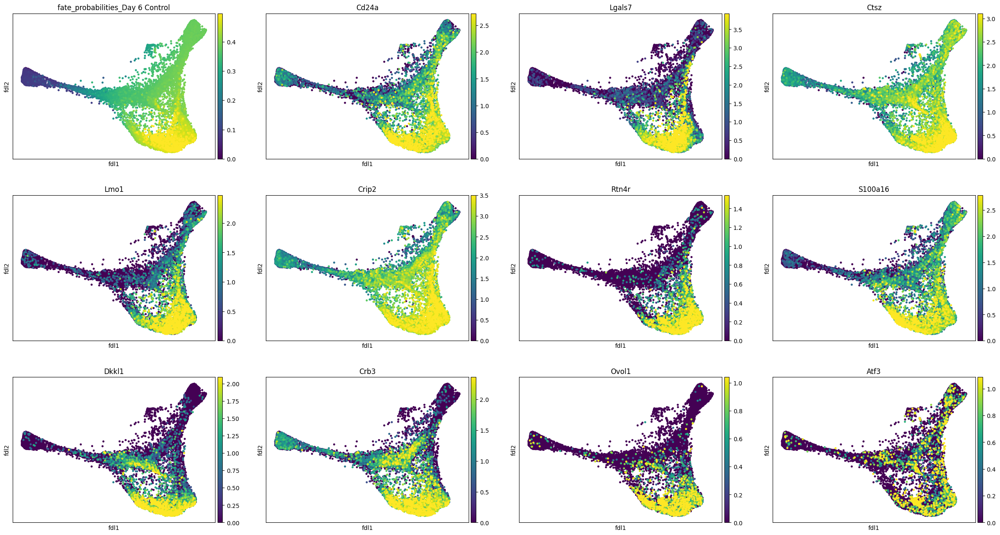

In [50]:
# Visualize driver genes for day 12 control

terminal_state = dead_end
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:11]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

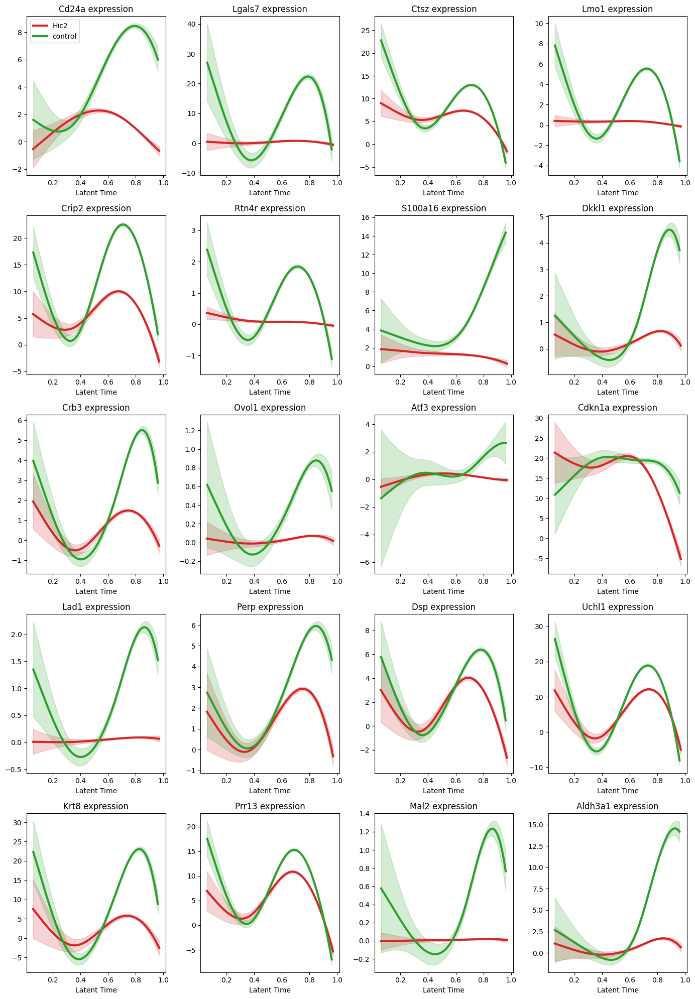

In [52]:
# Expression of drivers
control_driver_genes = driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index

plot_grouped_gene_trend(
    adata, 
    control_driver_genes, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


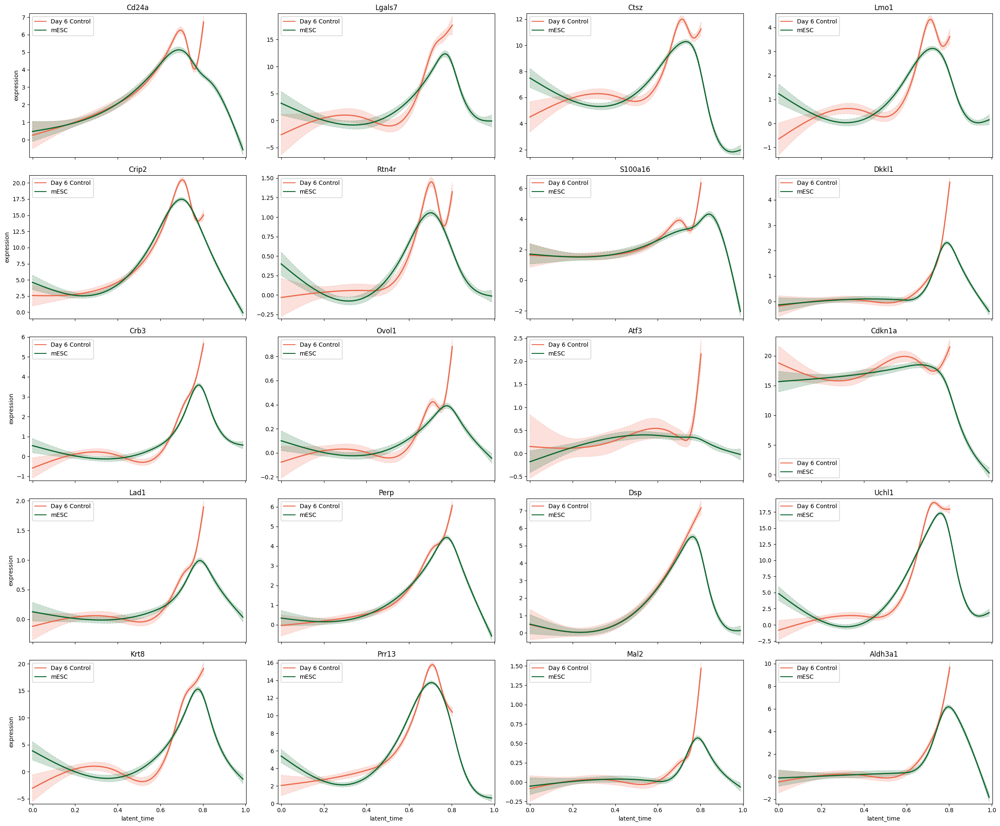

In [54]:
# The 20 strongest drivers of dead end in all cells

model = cellrank.models.GAMR(adata, n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata,
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

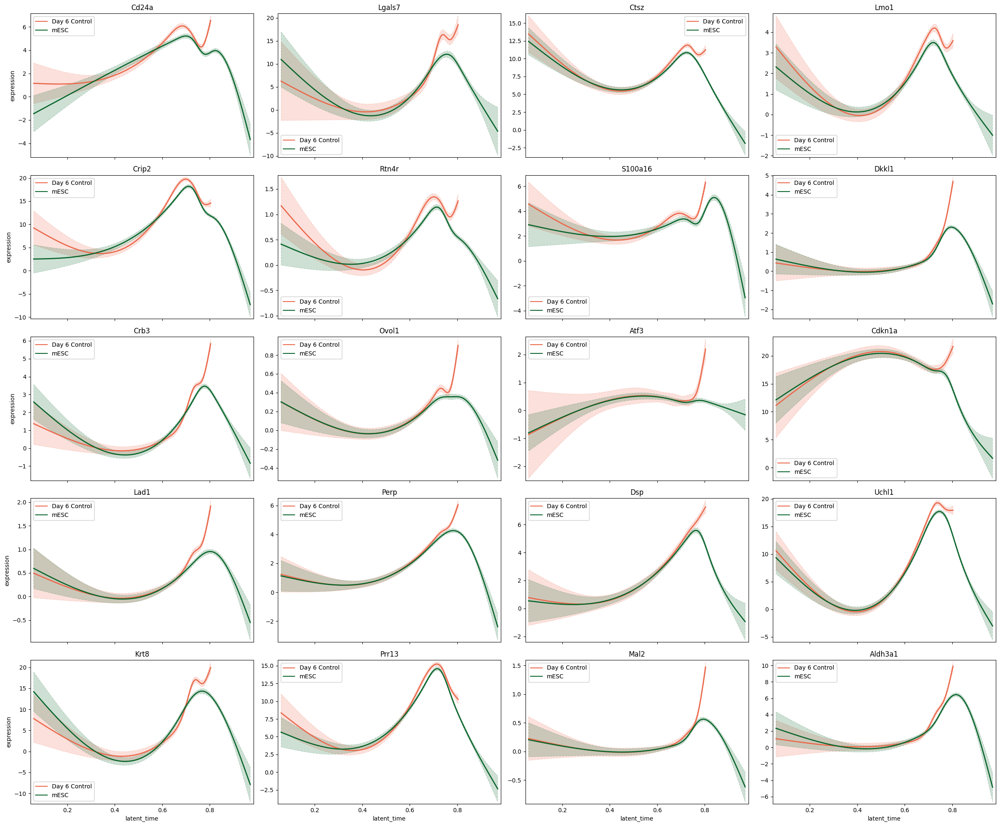

In [56]:
# The 20 strongest drivers of dead end in only control and Hic2

reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


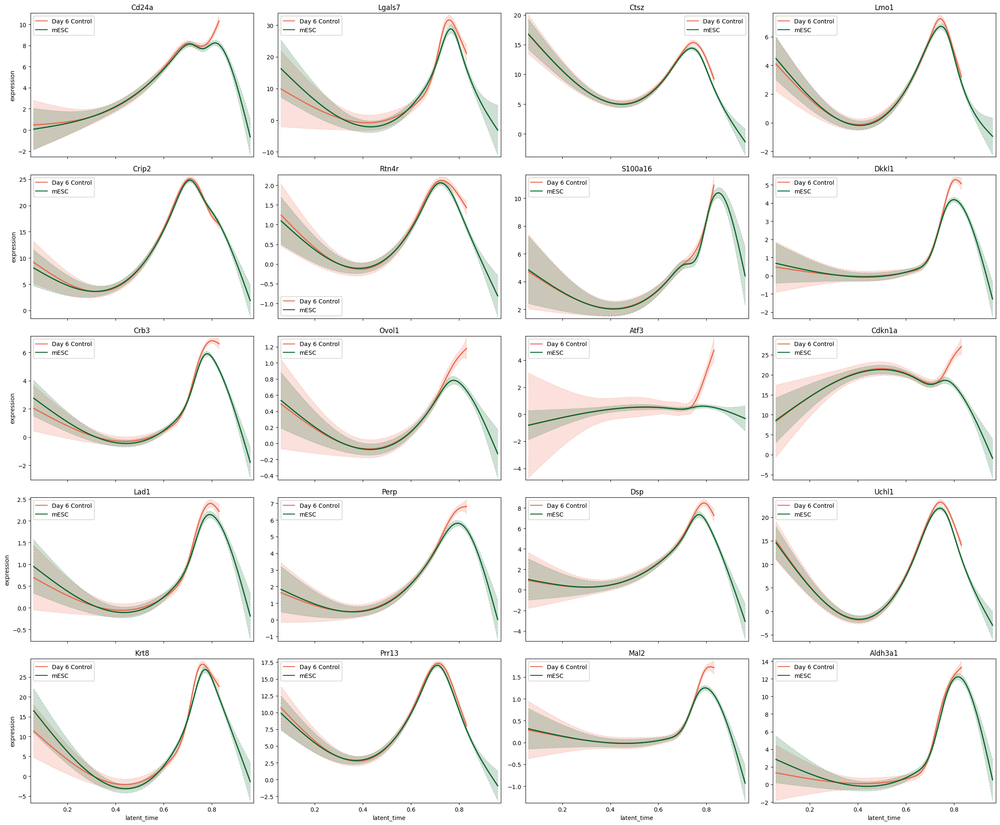

In [57]:
# Drivers with only control

model = cellrank.models.GAMR(adata[adata.obs["group"] == "control"], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

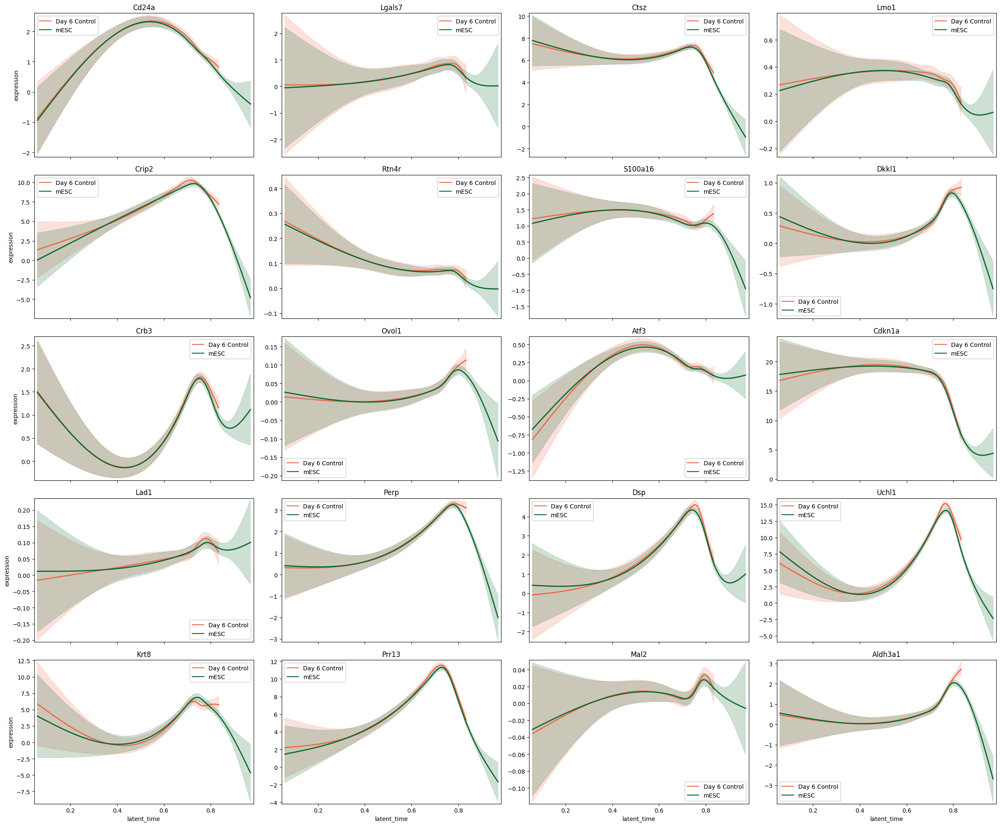

In [58]:
# Drivers with only Hic2

hic2_indices = adata.obs["group"] == "Hic2"
model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/40 [00:00<?, ?gene/s]

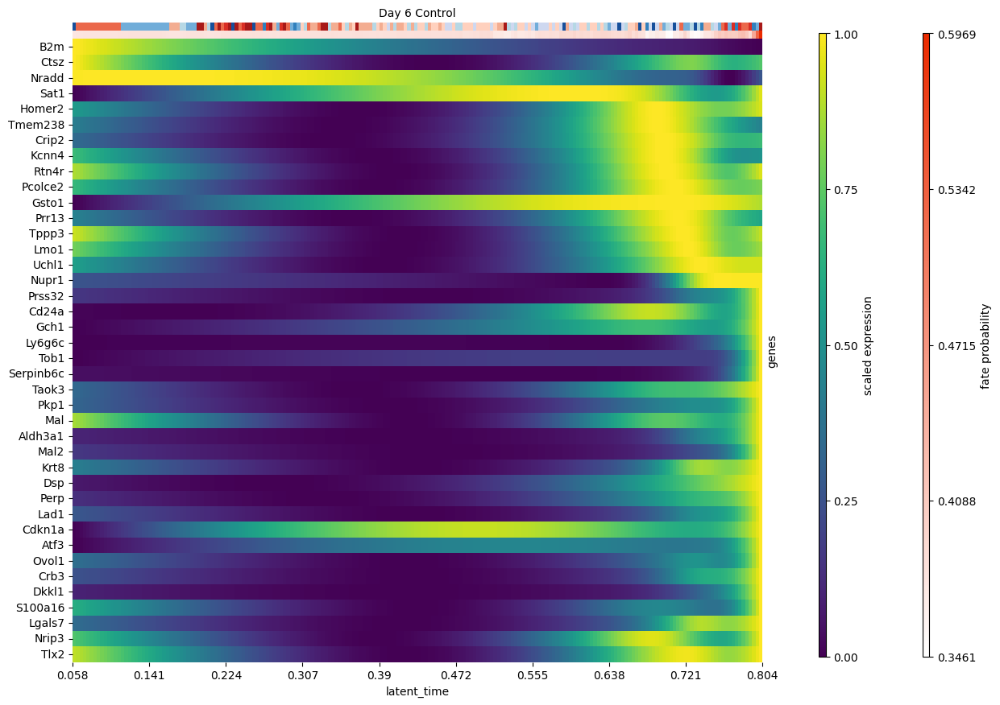

In [59]:
# Heatmap for dead-end related genes

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)
cellrank.pl.heatmap(
    adata[reprogramming_group_indices],
    model=model,  # use the model from before
    lineages=dead_end,
    cluster_key="sample",
    show_fate_probabilities=True,
    data_key="spliced",
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(40).index,
    time_key="latent_time",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)


### Expression trends for iPSC drivers

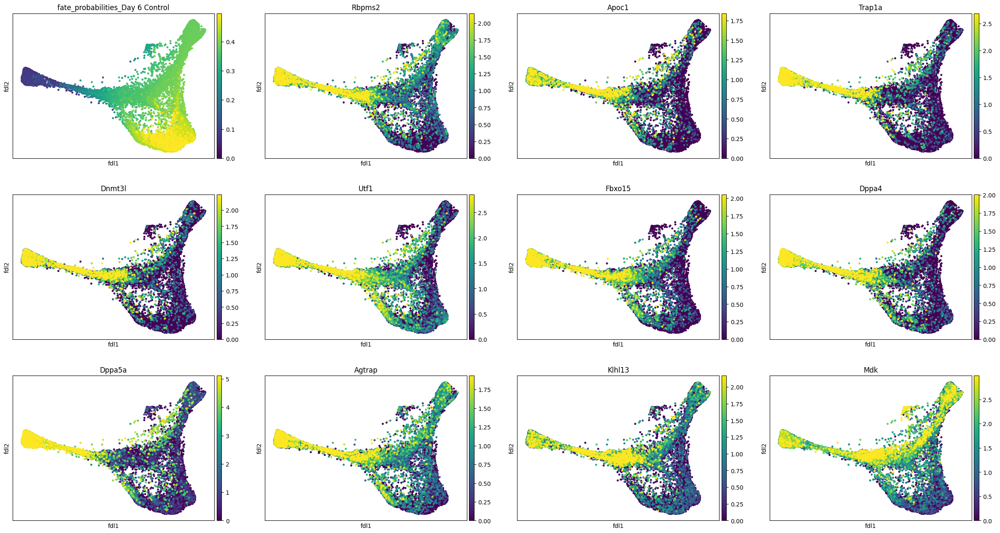

In [60]:
# Visualize driver genes for iPSC

terminal_state = dead_end
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=True).index[:11]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

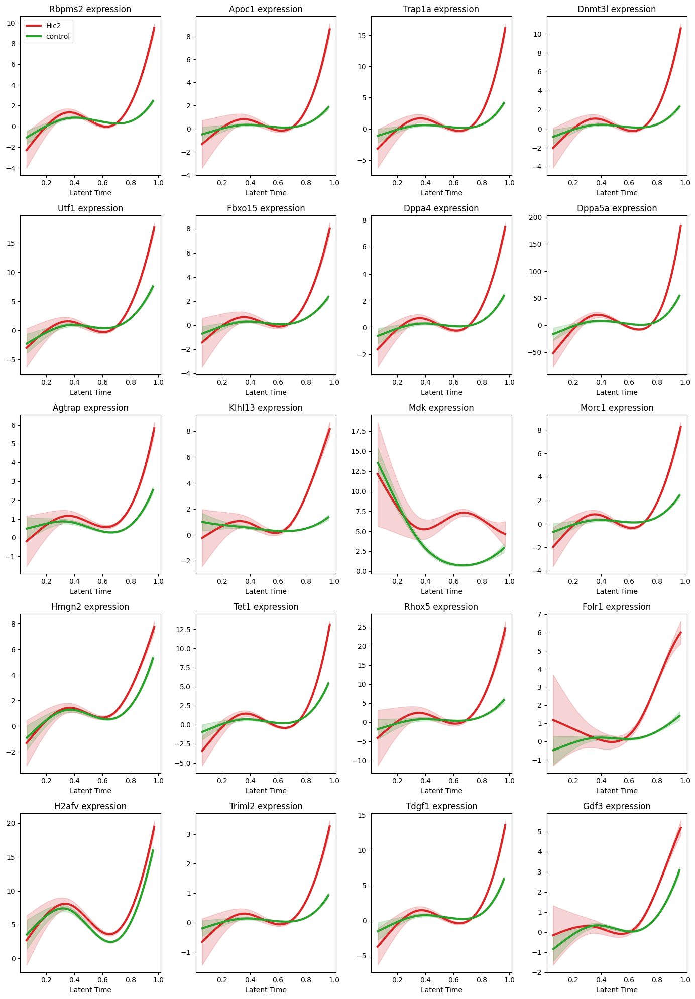

In [61]:
# Expression of reprogramming drivers
mesc_driver_genes = driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index

plot_grouped_gene_trend(
    adata, 
    mesc_driver_genes, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

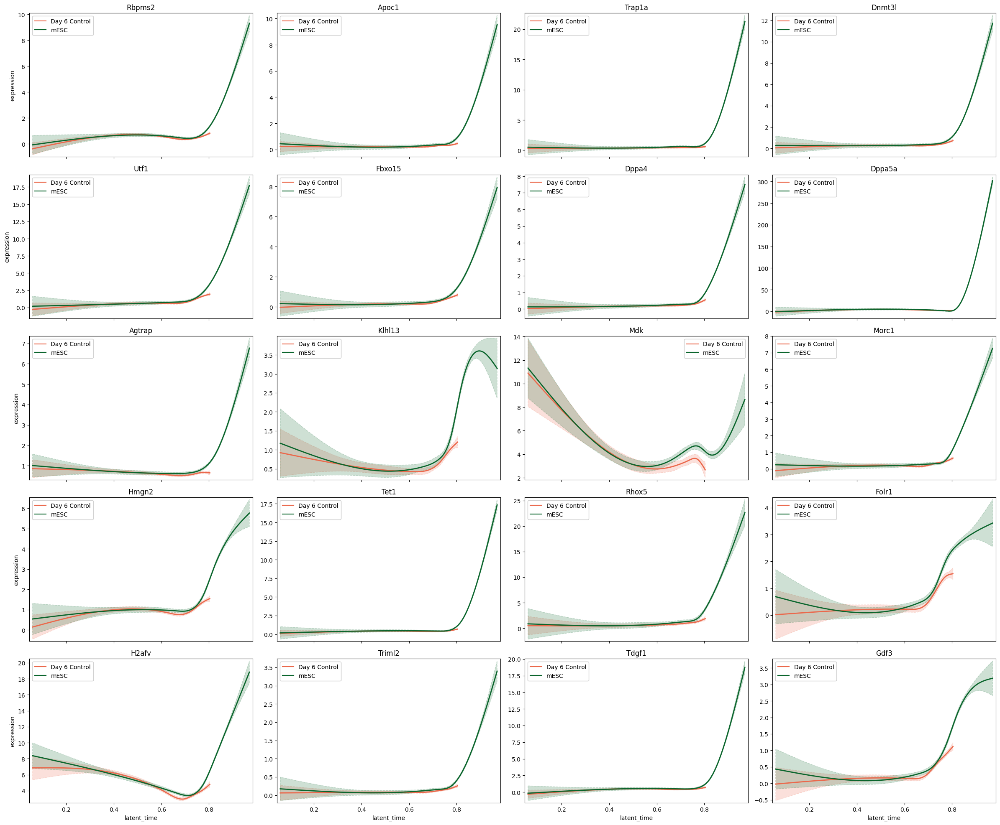

In [62]:
# The 20 strongest drivers of reprogramming in only control and Hic2

reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


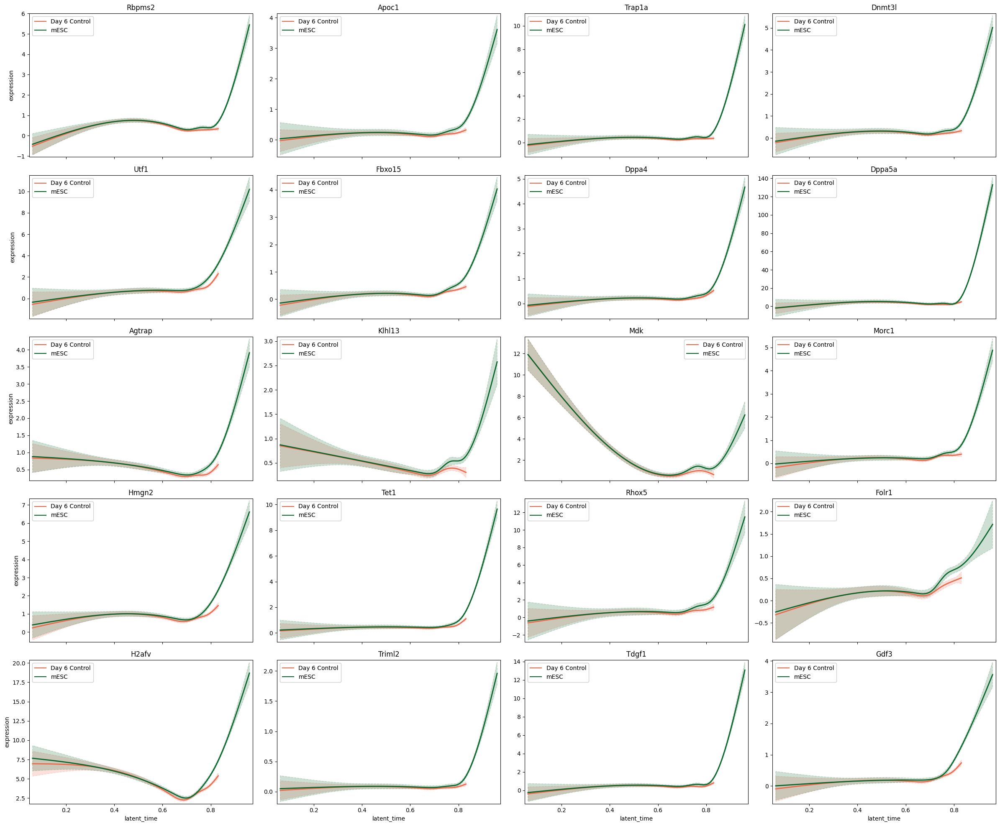

In [63]:
# The 20 strongest drivers of reprogramming in only control

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/40 [00:00<?, ?gene/s]

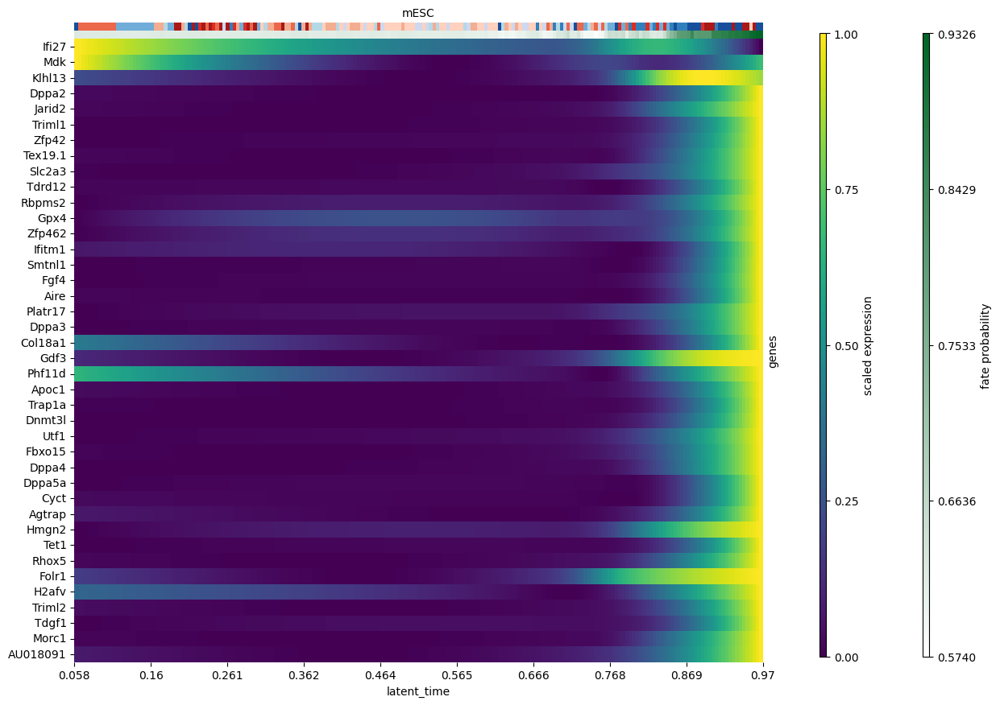

In [64]:
# Heatmap for completed reprogramming

terminal_state = "mESC"
model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)
cellrank.pl.heatmap(
    adata[reprogramming_group_indices],
    model=model,  # use the model from before
    lineages=terminal_state,
    cluster_key="sample",
    show_fate_probabilities=True,
    data_key="spliced",
    genes=driver_df.sort_values(f"{terminal_state}_corr", ascending=False).head(40).index,
    time_key="latent_time",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)


# Save results

In [ ]:
# # Save results

# base_name = "cellrank_scvelo_1.3"

# adata.write_h5ad(
#     working_directory+f"/{base_name} cells.h5ad",
#     compression=hdf5plugin.FILTERS["zstd"]
# )

# driver_df.to_csv(
#     working_directory+f"{base_name} driver genes.csv",
# )